<a href="https://colab.research.google.com/github/NanThanThanSoe/DIP_ImageEnhancement/blob/master/DIPProject_Nan.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Proposed Method for Image Enhancement**

**Input Image** --> **Local HE** --> **Global HE** --> **FFT** --> **HPF/LPF** --> **IFFT** --> **Output Image**

In [0]:
# import required libraries
import cv2
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import scipy
from skimage import data
from skimage.util.dtype import dtype_range
from skimage.util import img_as_ubyte
from skimage import exposure
from skimage.morphology import disk
from skimage.filters import rank
from skimage.io import imread

In [0]:
image1 = imread("/content/drive/My Drive/lena_gray.bmp", cv2.COLOR_RGB2BGR)
image2 = imread("/content/drive/My Drive/image/ferry.jpg", cv2.COLOR_RGB2BGR)
image3 = imread("/content/drive/My Drive/image/barbara.bmp", cv2.COLOR_RGB2BGR)
image4 = imread("/content/drive/My Drive/image/1.jpg", cv2.COLOR_RGB2BGR)
image5 = imread("/content/drive/My Drive/image/BOAT.bmp", cv2.COLOR_RGB2BGR)

1. Localized the original image
2. Globalized the localized image

In [0]:
# function for localized and globalized
def local_global(img):
  # Local equalized the original image
  selem = disk(30)
  img_eq = rank.equalize(img, selem=selem)

  # Global equalized the original image
  img_rescale = exposure.equalize_hist(img)

  # Global equalized the localized image
  img_gloeq = exposure.equalize_hist(img_eq)

  return img_eq, img_rescale, img_gloeq

3. Apply FFT to image from step 2

In [0]:
# function for fft
def fft_img(image):
  img_fft = np.fft.fft2(image)

  # Amplitude component
  img_aoi = np.log(np.absolute(img_fft))

  # Phase component
  img_phase = np.angle(img_fft)
  
  return image, img_aoi, img_phase

The relationship between blurring mask and derivative mask with a high pass filter and low pass filter can be defined simply as.

- Blurring masks are also called as low pass filter
- Derivative masks are also called as high pass filter

The high pass frequency components denotes edges whereas the low pass frequency components denotes smooth regions.

When one is placed inside and the zero is placed outside , we got a blurred image. ==> low pass filter

When 0 is placed inside, we get edges, which gives us a sketched image. ==>high pass filter

LPF is usually used to remove noise, blur, smoothen an image.
Whereas HPF is usually used to detect edges in an image. 

4. Apply LPF to image from step 3

In [0]:
def lowpass_filter(image):
  # apply fft to image
  # img_fft = np.fft.fft2(image)
  # create a 3x3 kernel, low pass filter
  kernel_3x3 = np.array([
      [0, 0, 0],
      [0,  1, 0],
      [0, 0, 0]
  ])

  # convolve image with kernel
  img = scipy.ndimage.convolve(image, kernel_3x3)
  img_1 = cv2.filter2D(image, -1, kernel_3x3)

  return img_1

4. Apply HPF to image from step 3

In [0]:
def highpass_filter(image):
  # img_fft = np.fft.fft(image)
  # create a 3x3 kernel, high pass filter
  ker_3x3 = np.array([
      [1, 1, 1],
      [1,  8, 1],
      [1, 1, 1]
  ])

  # convolve image with kernel
  img = scipy.ndimage.convolve(image, ker_3x3)
  img_1 = cv2.filter2D(image, -1, ker_3x3)

  return img_1

5. Recombined images from step 4: LPF image and HPF image

In [0]:
# apply ifft and recombine image function
def ifft(image):
  img = cv2.idft(image)
  img = cv2.dft(img)
  return img

def combine_img(img1, img2):
  img1 = ifft(img1)
  img2 = ifft(img2)
  img = cv2. addWeighted(img1, 0.5, img2, 0.2, 0)
  #final image
  return img


In [0]:
# function for histogram
def hist_imgOri(image):
  img = image.flatten()
  b = plt.hist(img)
  plt.title("Original image Histogram")
  return plt.show(b)

def hist_imgGlo(image):
  img = image.flatten()
  b = plt.hist(img)
  plt.title("Globalized image Histogram")
  return plt.show(b)

def hist_imgFinal(image):
  img = image.flatten()
  b = plt.hist(img)
  plt.title("Fimal image Histogram")
  return plt.show(b)

Display images and results

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a2ad56d30>,
 Text(0.5, 1.0, 'Image 5'))

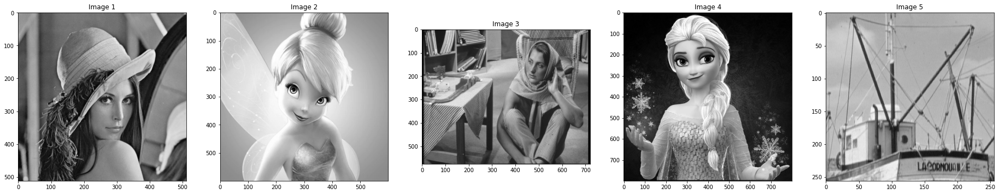

In [9]:
# display original images
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image1,cmap='gray'), plt.title( "Image 1")
plt.subplot(152),plt.imshow(image2,cmap='gray'), plt.title( "Image 2")
plt.subplot(153),plt.imshow(image3,cmap='gray'), plt.title( "Image 3")
plt.subplot(154),plt.imshow(image4,cmap='gray'), plt.title( "Image 4")
plt.subplot(155),plt.imshow(image5,cmap='gray'), plt.title( "Image 5")

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28ef1860>,
 Text(0.5, 1.0, 'Global equalized the localized image'))

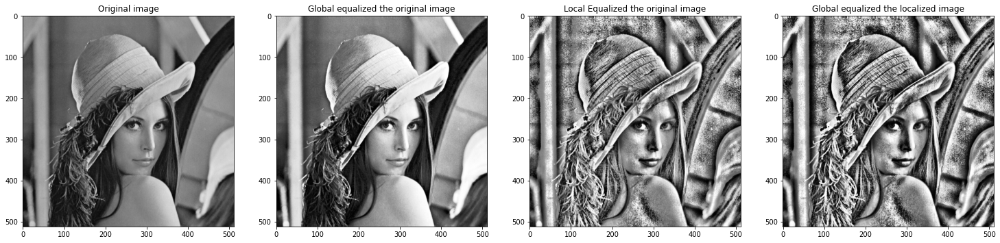

In [10]:
img_eq1, img_rescale1, img_gloeq1 = local_global(image1)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image1,cmap='gray'), plt.title( "Original image")
plt.subplot(152),plt.imshow(img_rescale1,cmap='gray'), plt.title( "Global equalized the original image")
plt.subplot(153),plt.imshow(img_eq1,cmap='gray'), plt.title( "Local Equalized the original image")
plt.subplot(154),plt.imshow(img_gloeq1,cmap='gray'), plt.title( "Global equalized the localized image")

/usr/local/lib/python3.6/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28d79a58>,
 Text(0.5, 1.0, 'Global equalized the localized image'))

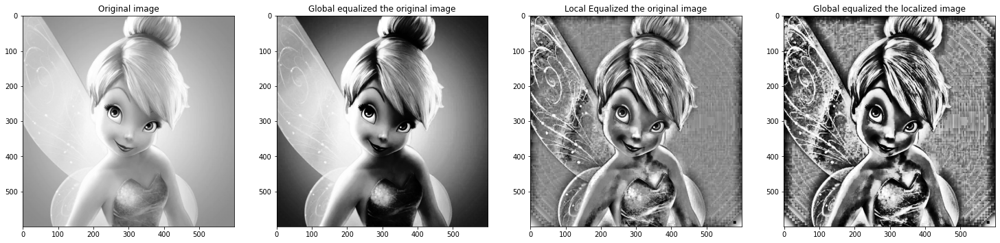

In [11]:
img_eq2, img_rescale2, img_gloeq2 = local_global(image2)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image2,cmap='gray'), plt.title( "Original image")
plt.subplot(152),plt.imshow(img_rescale2,cmap='gray'), plt.title( "Global equalized the original image")
plt.subplot(153),plt.imshow(img_eq2,cmap='gray'), plt.title( "Local Equalized the original image")
plt.subplot(154),plt.imshow(img_gloeq2,cmap='gray'), plt.title( "Global equalized the localized image")

/usr/local/lib/python3.6/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28c645f8>,
 Text(0.5, 1.0, 'Global equalized the localized image'))

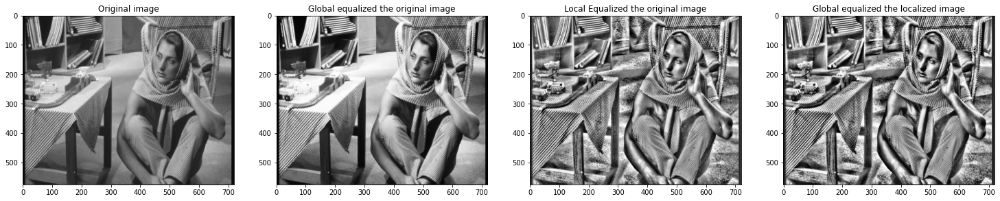

In [12]:
img_eq3, img_rescale3, img_gloeq3 = local_global(image3)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image3,cmap='gray'), plt.title( "Original image")
plt.subplot(152),plt.imshow(img_rescale3,cmap='gray'), plt.title( "Global equalized the original image")
plt.subplot(153),plt.imshow(img_eq3,cmap='gray'), plt.title( "Local Equalized the original image")
plt.subplot(154),plt.imshow(img_gloeq3,cmap='gray'), plt.title( "Global equalized the localized image")

/usr/local/lib/python3.6/dist-packages/skimage/filters/rank/generic.py:119: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  out_dtype)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28ac1cc0>,
 Text(0.5, 1.0, 'Global equalized the localized image'))

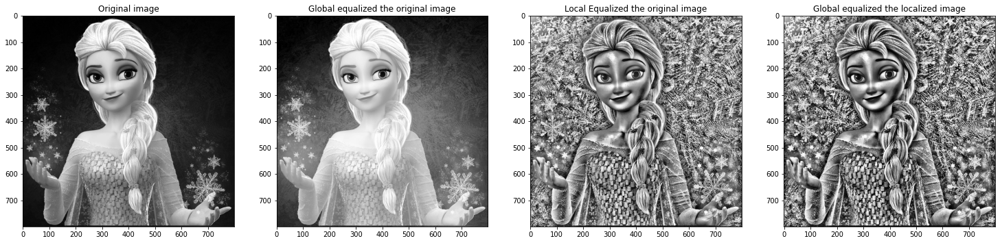

In [13]:
img_eq4, img_rescale4, img_gloeq4 = local_global(image4)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image4,cmap='gray'), plt.title( "Original image")
plt.subplot(152),plt.imshow(img_rescale4,cmap='gray'), plt.title( "Global equalized the original image")
plt.subplot(153),plt.imshow(img_eq4,cmap='gray'), plt.title( "Local Equalized the original image")
plt.subplot(154),plt.imshow(img_gloeq4,cmap='gray'), plt.title( "Global equalized the localized image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a2895b4e0>,
 Text(0.5, 1.0, 'Global equalized the localized image'))

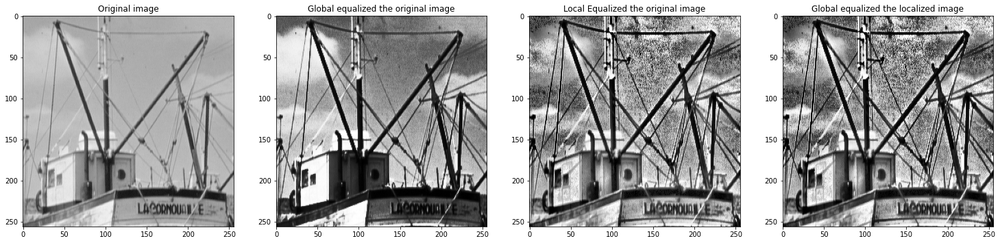

In [14]:
img_eq5, img_rescale5, img_gloeq5 = local_global(image5)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(image5,cmap='gray'), plt.title( "Original image")
plt.subplot(152),plt.imshow(img_rescale5,cmap='gray'), plt.title( "Global equalized the original image")
plt.subplot(153),plt.imshow(img_eq5,cmap='gray'), plt.title( "Local Equalized the original image")
plt.subplot(154),plt.imshow(img_gloeq5,cmap='gray'), plt.title( "Global equalized the localized image")

In [0]:
img_fft1, img_aoi1, img_phase1  = fft_img(img_gloeq1)
img_fft2, img_aoi2, img_phase2  = fft_img(img_gloeq2)
img_fft3, img_aoi3, img_phase3  = fft_img(img_gloeq3)
img_fft4, img_aoi4, img_phase4  = fft_img(img_gloeq4)
img_fft5, img_aoi5, img_phase5  = fft_img(img_gloeq5)

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a287cb2e8>,
 Text(0.5, 1.0, 'Amplitude image'))

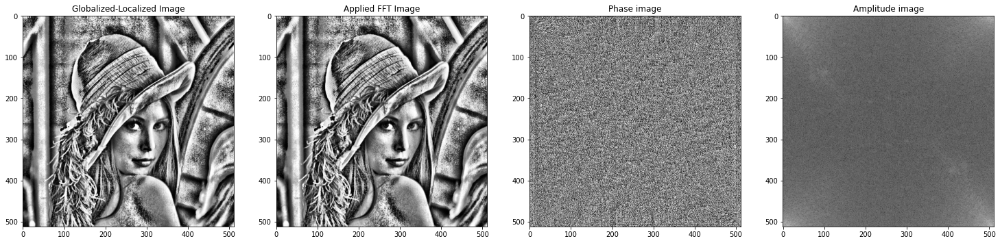

In [16]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(img_gloeq1,cmap='gray'), plt.title( "Globalized-Localized Image")
plt.subplot(152),plt.imshow(img_fft1,cmap='gray'), plt.title( "Applied FFT Image")
plt.subplot(153),plt.imshow(img_phase1,cmap='gray'), plt.title( "Phase image")
plt.subplot(154),plt.imshow(img_aoi1,cmap='gray'), plt.title( "Amplitude image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a286adf98>,
 Text(0.5, 1.0, 'Amplitude image'))

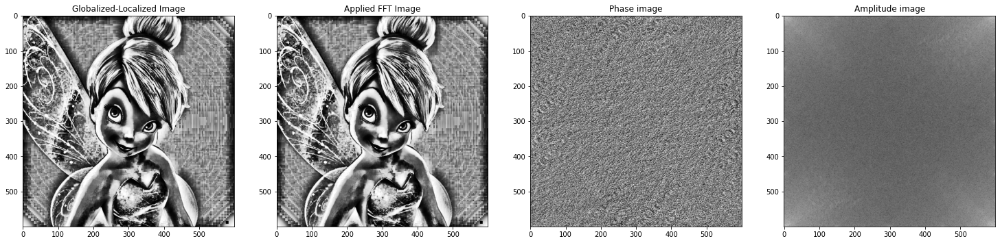

In [17]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(img_gloeq2,cmap='gray'), plt.title( "Globalized-Localized Image")
plt.subplot(152),plt.imshow(img_fft2,cmap='gray'), plt.title( "Applied FFT Image")
plt.subplot(153),plt.imshow(img_phase2,cmap='gray'), plt.title( "Phase image")
plt.subplot(154),plt.imshow(img_aoi2,cmap='gray'), plt.title( "Amplitude image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28516cf8>,
 Text(0.5, 1.0, 'Amplitude image'))

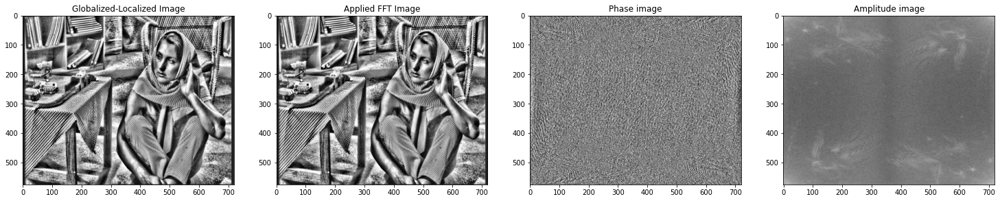

In [18]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(img_gloeq3,cmap='gray'), plt.title( "Globalized-Localized Image")
plt.subplot(152),plt.imshow(img_fft3,cmap='gray'), plt.title( "Applied FFT Image")
plt.subplot(153),plt.imshow(img_phase3,cmap='gray'), plt.title( "Phase image")
plt.subplot(154),plt.imshow(img_aoi3,cmap='gray'), plt.title( "Amplitude image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28396278>,
 Text(0.5, 1.0, 'Amplitude image'))

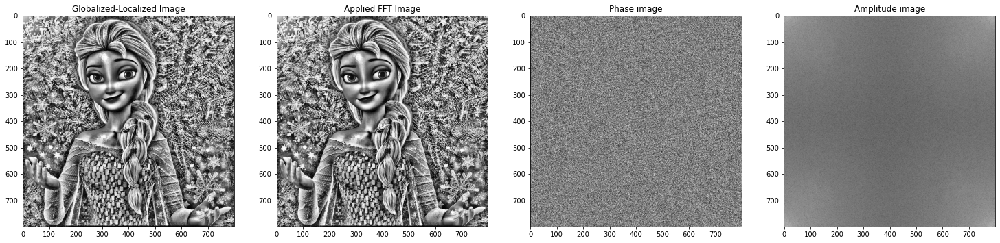

In [19]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(img_gloeq4,cmap='gray'), plt.title( "Globalized-Localized Image")
plt.subplot(152),plt.imshow(img_fft4,cmap='gray'), plt.title( "Applied FFT Image")
plt.subplot(153),plt.imshow(img_phase4,cmap='gray'), plt.title( "Phase image")
plt.subplot(154),plt.imshow(img_aoi4,cmap='gray'), plt.title( "Amplitude image")

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28215048>,
 Text(0.5, 1.0, 'Amplitude image'))

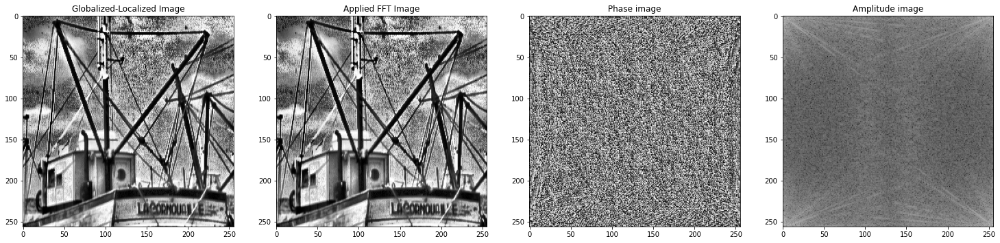

In [20]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(img_gloeq5,cmap='gray'), plt.title( "Globalized-Localized Image")
plt.subplot(152),plt.imshow(img_fft5,cmap='gray'), plt.title( "Applied FFT Image")
plt.subplot(153),plt.imshow(img_phase5,cmap='gray'), plt.title( "Phase image")
plt.subplot(154),plt.imshow(img_aoi5,cmap='gray'), plt.title( "Amplitude image")

In [0]:
# apply LPF
img1 = lowpass_filter(img_fft1)
img2 = lowpass_filter(img_fft2)
img3 = lowpass_filter(img_fft3)
img4 = lowpass_filter(img_fft4)
img5 = lowpass_filter(img_fft5)
# apply HPF
img1h = highpass_filter(img_fft1)
img2h = highpass_filter(img_fft2)
img3h = highpass_filter(img_fft3)
img4h = highpass_filter(img_fft4)
img5h = highpass_filter(img_fft5)
# Combine HPF & LPF
res_im1 = combine_img(img1, img1h)
res_im2 = combine_img(img2, img2h)
res_im3 = combine_img(img3, img3h)
res_im4 = combine_img(img4, img4h)
res_im5 = combine_img(img5, img5h)

Final results of proposed method

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a28033cf8>,
 Text(0.5, 1.0, 'Resulted image 5'))

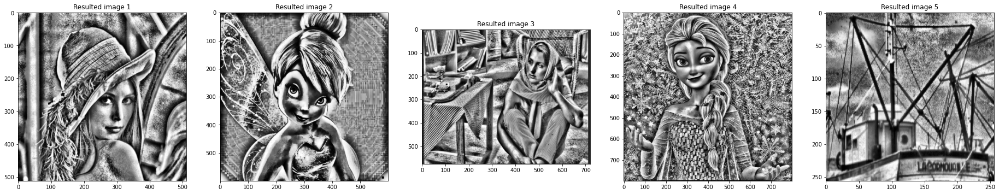

In [22]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(151),plt.imshow(res_im1,cmap='gray'), plt.title( "Resulted image 1")
plt.subplot(152),plt.imshow(res_im2,cmap='gray'), plt.title( "Resulted image 2")
plt.subplot(153),plt.imshow(res_im3,cmap='gray'), plt.title( "Resulted image 3")
plt.subplot(154),plt.imshow(res_im4,cmap='gray'), plt.title( "Resulted image 4")
plt.subplot(155),plt.imshow(res_im5,cmap='gray'), plt.title( "Resulted image 5")

Compare images with its histogram respectively 

(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a27c0cda0>,
 Text(0.5, 1.0, 'Proposed Method'))

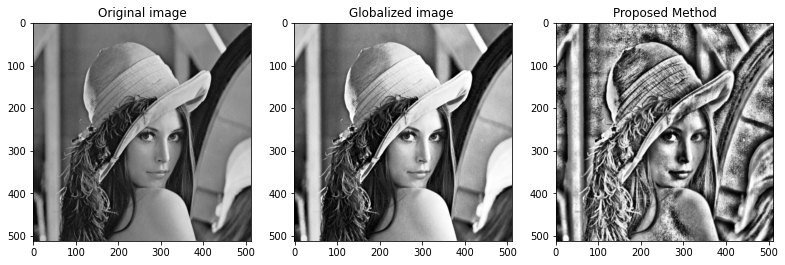

In [28]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(171),plt.imshow(image1,cmap='gray'), plt.title( "Original image")
plt.subplot(172),plt.imshow(img_rescale1,cmap='gray'), plt.title( "Globalized image ")   
plt.subplot(173),plt.imshow(res_im1,cmap='gray'), plt.title( "Proposed Method")


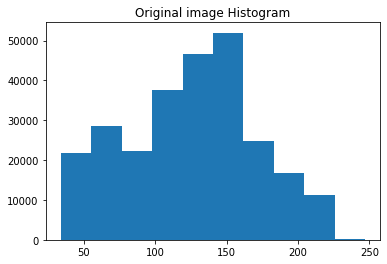

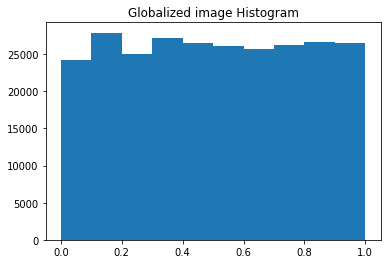

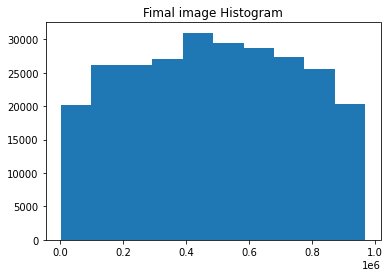

In [29]:
im1Ori = hist_imgOri(image1)
im1Glo = hist_imgGlo(img_rescale1)
im1F = hist_imgFinal(res_im1)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a278870b8>,
 Text(0.5, 1.0, 'Proposed Method'))

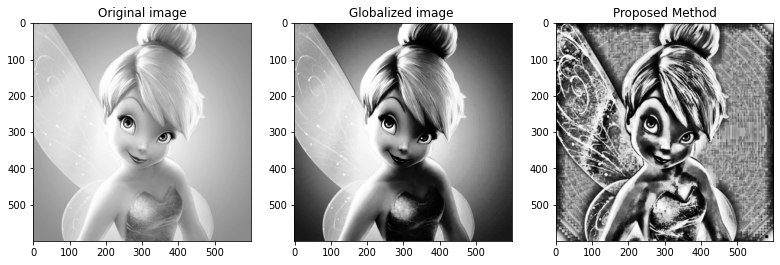

In [30]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(171),plt.imshow(image2,cmap='gray'), plt.title( "Original image")
plt.subplot(172),plt.imshow(img_rescale2,cmap='gray'), plt.title( "Globalized image ")   
plt.subplot(173),plt.imshow(res_im2,cmap='gray'), plt.title( "Proposed Method")


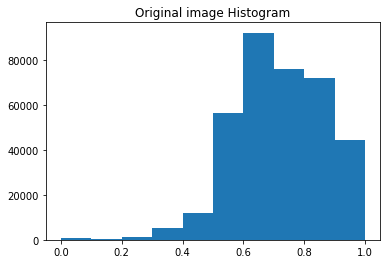

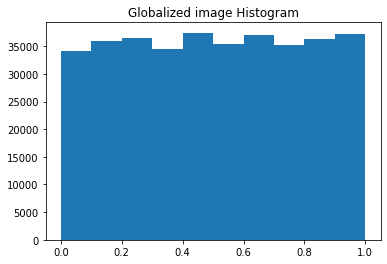

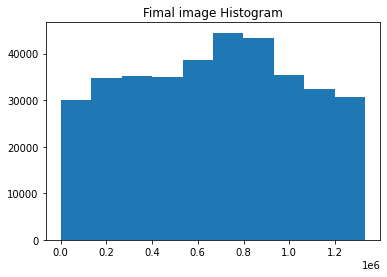

In [31]:
hist_imgOri(image2)
hist_imgGlo(img_rescale2)
hist_imgFinal(res_im2)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a275f0a58>,
 Text(0.5, 1.0, 'Proposed Method'))

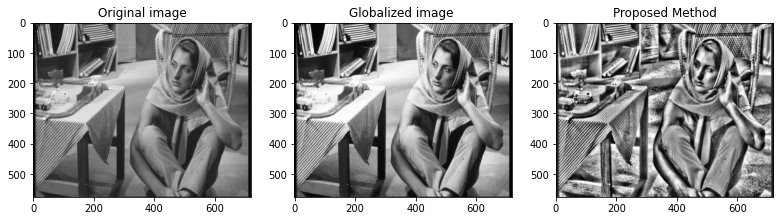

In [32]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(171),plt.imshow(image3,cmap='gray'), plt.title( "Original image")
plt.subplot(172),plt.imshow(img_rescale3,cmap='gray'), plt.title( "Globalized image ")   
plt.subplot(173),plt.imshow(res_im3,cmap='gray'), plt.title( "Proposed Method")


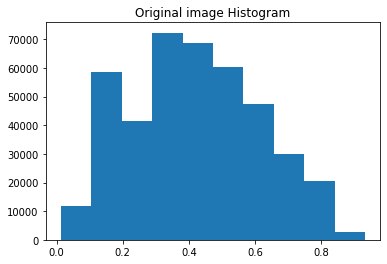

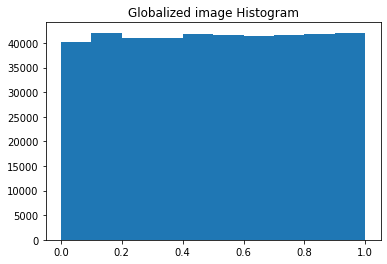

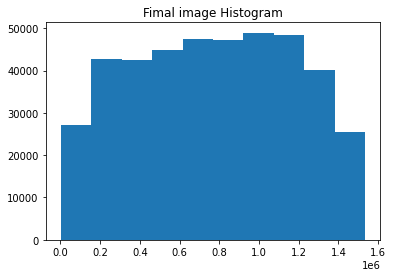

In [33]:
hist_imgOri(image3)
hist_imgGlo(img_rescale3)
hist_imgFinal(res_im3)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a273e96a0>,
 Text(0.5, 1.0, 'Proposed Method'))

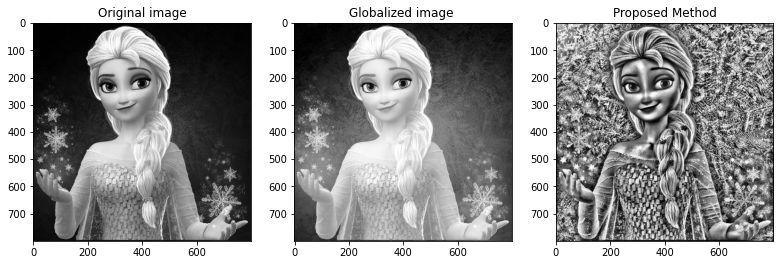

In [34]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(171),plt.imshow(image4,cmap='gray'), plt.title( "Original image")
plt.subplot(172),plt.imshow(img_rescale4,cmap='gray'), plt.title( "Globalized image ")   
plt.subplot(173),plt.imshow(res_im4,cmap='gray'), plt.title( "Proposed Method")


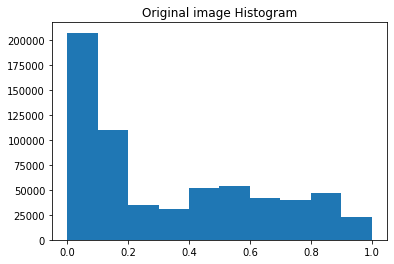

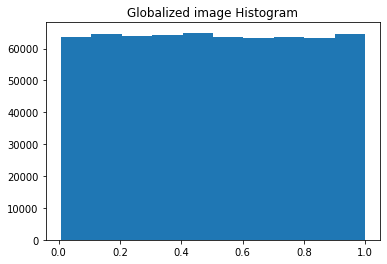

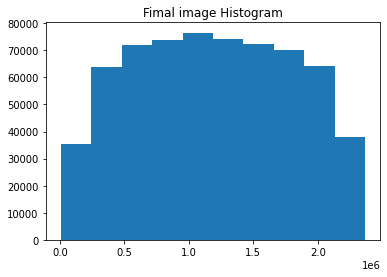

In [36]:
hist_imgOri(image4)
hist_imgGlo(img_rescale4)
hist_imgFinal(res_im4)


(<matplotlib.axes._subplots.AxesSubplot at 0x7f2a27276eb8>,
 Text(0.5, 1.0, 'Proposed Method'))

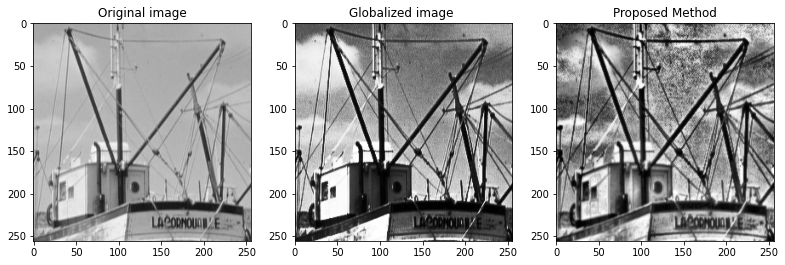

In [35]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
plt.subplot(171),plt.imshow(image5,cmap='gray'), plt.title( "Original image")
plt.subplot(172),plt.imshow(img_rescale5,cmap='gray'), plt.title( "Globalized image ")   
plt.subplot(173),plt.imshow(res_im5,cmap='gray'), plt.title( "Proposed Method")


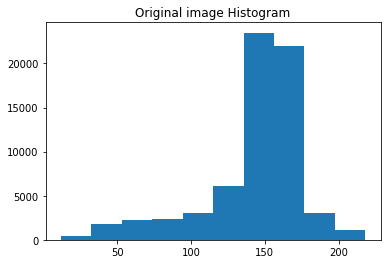

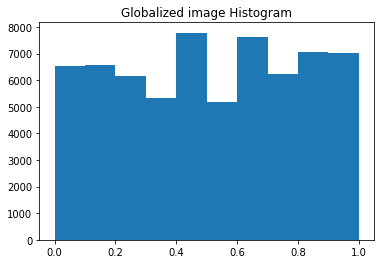

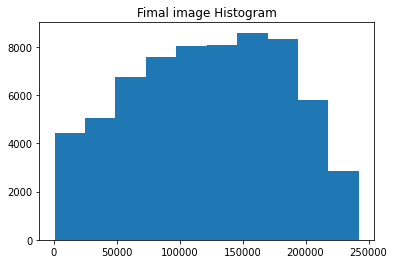

In [37]:
hist_imgOri(image5)
hist_imgGlo(img_rescale5)
hist_imgFinal(res_im5)
